## Object recognition in photos with DETR

Based on [a tutorial](https://learnopencv.com/detr-overview-and-inference/) from Learn OpenCV.

In [1]:
from transformers import DetrImageProcessor, DetrForObjectDetection 
import torch 
from PIL import Image 
import requests 

## Explore model options on Hugging Face Hub

There's quite a few pre-trained object detection models we could choose from on Hugging Face Hub. Let's have a look at them.

## Let's load in an image to get started!

I met these two at a cat cafe in Nice. Let's see whether we can get an object detection model to identify them.

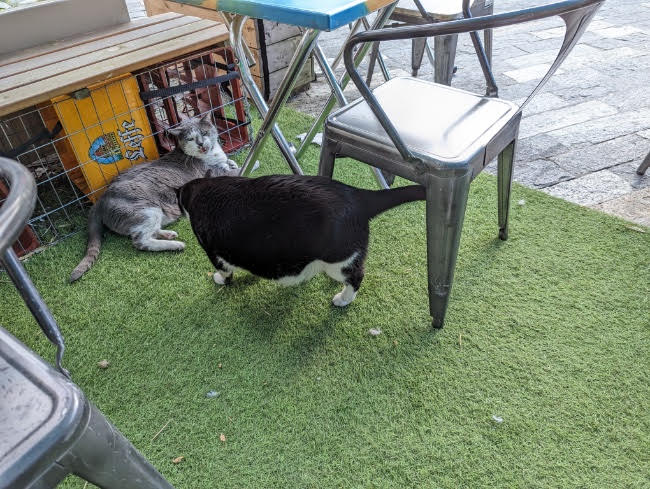

In [2]:
cat_image = Image.open("inference_data/own_images/cats.jpg")
cat_image

## First pass: let's try with Transformers alone

Steps:
* Read in the DETR ResNet-50 model
* Read in image and convert to tensors
* Create target sizes variable, which is the same size as the image
* Post-process the object detection output to get the class and probability, with probability at 0.9
* Return predicted objects and their coordinates

In [3]:
processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50", revision="no_timm") 
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50", revision="no_timm")  
 
inputs = processor(images=cat_image, return_tensors="pt") 
outputs = model(**inputs) 
 
## convert outputs (bounding boxes and class logits) to COCO API 
## let's only keep detections with score > 0.9 
target_sizes = torch.tensor([cat_image.size[::-1]]) 
results = processor.post_process_object_detection(outputs, target_sizes=target_sizes, threshold=0.9)[0] 
 
for score, label, box in zip(results["scores"], results["labels"], results["boxes"]): 
    box = [round(i, 2) for i in box.tolist()] 
    print( 
            f"Detected {model.config.id2label[label.item()]} with confidence " 
            f"{round(score.item(), 3)} at location {box}" 
    )

Detected chair with confidence 0.94 at location [0.19, 149.47, 65.82, 369.22]
Detected cat with confidence 0.996 at location [65.76, 105.43, 239.94, 282.6]
Detected cat with confidence 0.993 at location [176.81, 171.09, 429.71, 307.9]


## Let's visualise this with OpenCV!

These raw predictions are great, but it would be even _better_ to have these bounding boxes shown on the image, so we can more easy check if the predictions are correct.

We can use OpenCV to do this!

The first thing we need to do is read in the image with OpenCV's `imread`. By default, the image will be read in BGR.

In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

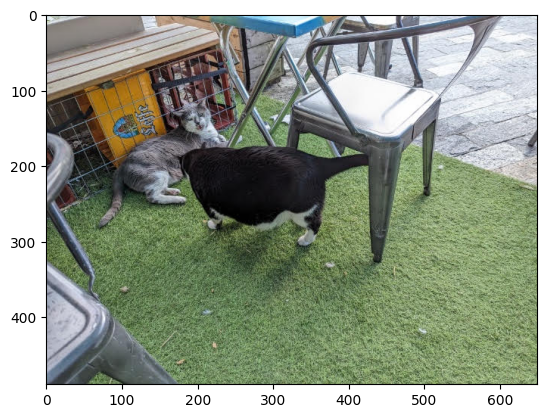

In [5]:
img = cv2.imread("inference_data/own_images/cats.jpg")
plt.imshow(img[:,:,::-1]); plt.show();

## Prepare to create the bounding boxes

To make sure our bounding boxes give us clear information, and look nice on the image, we'll create a couple of convenience functions.

The first will calculate the correct font size for the label, based on the size of the bounding box.

In [6]:
def calculate_label_size(box_width, box_height, frame_width, frame_height, min_scale=0.4, max_scale=1.2):
    """
    Calculate appropriate font scale based on bounding box size and frame dimensions.
    """
    box_size_ratio = (box_width * box_height) / (frame_width * frame_height)
    font_scale = min_scale + (np.log(1 + box_size_ratio * 100) / 5) * (max_scale - min_scale)
    return np.clip(font_scale, min_scale, max_scale)

Next, we make a function that generates a separate colour for each label that is predicted for a given image.

In [7]:
def generate_color_palette(num_classes):
    """
    Generate a separate colour for every label predicted for that image. 
    """
    np.random.seed(42)  # Ensure the same colors are generated every time
    return {label: tuple(np.random.randint(0, 255, 3).tolist()) for label in range(num_classes)}

Finally, we associate each label with a specific colour, to make sure all objects of the same class have the same colour.

In [8]:
# Create a color palette for each class (COCO has 91 classes by default)
colors = generate_color_palette(num_classes=91)

# Function to get the color for a specific label
def get_label_color(label):
    return colors.get(label, (0, 255, 0))  # Default to green if no label found

## Predicting the labels and plotting the bounding boxes

* Read in the image, and convert it from BGR to RGB. We also convert the raw image into tensors.
* We pass the image into the model for inference, using `torch.no_grad()` (this tells PyTorch not to update the model gradients, as the model is already trained)
* As with above, we post-process the predictions to extract the labels, probabilities and coordinates of the bounding boxes. 
* We filter the outputs based on our probability threshold (by default, 0.9).
* Finally, for each box, label and score tuple, we:
    * Calculate the box size
    * Calculate the label font size based on the box size
    * Create a box label, consisting of the class and the probability
    * Associate a colour with the label, then render the box and label.
* Finally, the image with all of the bounding boxes are rendered.

In [9]:
image = cv2.imread("inference_data/own_images/cats.jpg")
image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
inputs = processor(images=image_rgb, return_tensors="pt")

In [10]:
inputs["pixel_values"]

tensor([[[[ 0.0227,  0.1426,  0.2967,  ...,  1.5810,  1.5810,  1.5810],
          [ 0.4337,  0.4337,  0.3994,  ...,  1.4269,  1.4098,  1.4098],
          [ 1.0159,  0.8447,  0.5536,  ...,  1.2214,  1.2043,  1.2043],
          ...,
          [-0.2513, -0.2684, -0.2856,  ...,  0.2111,  0.0569, -0.0458],
          [-0.3027, -0.3369, -0.3712,  ..., -0.1828,  0.1426,  0.3823],
          [-0.3369, -0.3883, -0.4397,  ..., -0.4568,  0.2111,  0.6906]],

         [[ 0.4678,  0.5728,  0.7304,  ...,  1.9034,  1.9034,  1.9034],
          [ 0.8880,  0.8704,  0.8354,  ...,  1.7458,  1.7283,  1.7283],
          [ 1.4657,  1.2906,  0.9930,  ...,  1.5357,  1.5182,  1.5182],
          ...,
          [ 0.0126, -0.0049, -0.0224,  ...,  0.7129,  0.5553,  0.4503],
          [ 0.0301, -0.0049, -0.0574,  ...,  0.3102,  0.6429,  0.8880],
          [ 0.0476, -0.0049, -0.0924,  ...,  0.0476,  0.7304,  1.2206]],

         [[ 0.2696,  0.4091,  0.6182,  ...,  2.2740,  2.2740,  2.2740],
          [ 0.7228,  0.7228,  

In [11]:
# Function to predict and plot bounding boxes
def predict_and_plot_boxes(image_path, threshold=0.9):
    # Step 1: Load and preprocess the image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    inputs = processor(images=image_rgb, return_tensors="pt")

    # Step 2: Run inference
    with torch.no_grad():
        outputs = model(**inputs)

    # Step 3: Post-process the results
    # Convert the outputs (logits) into bounding boxes and labels
    target_sizes = torch.tensor([image_rgb.shape[:2]])  # Image size (height, width)
    results = processor.post_process_object_detection(outputs, target_sizes=target_sizes)[0]

    # Filter boxes based on confidence score (threshold can be adjusted)
    scores = results["scores"].numpy()
    keep = scores > threshold

    boxes = results["boxes"].numpy()[keep]
    labels = results["labels"].numpy()[keep]
    scores = scores[keep]

    for box, label, score in zip(boxes, labels, scores):
        xmin, ymin, xmax, ymax = box
        box_width = xmax - xmin
        box_height = ymax - ymin
        img_width, img_height = image_rgb.shape[:2]
        font_scale = calculate_label_size(box_width, box_height, img_width, img_height, max_scale=1)

        label_text = f"{model.config.id2label[label]}: {score:.2f}"
        (text_width, text_height), baseline = cv2.getTextSize(
            label_text,
            cv2.FONT_HERSHEY_SIMPLEX,
            font_scale,
            1
        )

        # Get the color for this label
        color = get_label_color(label)

        # Draw rectangle and label with the same color for the same class
        cv2.rectangle(image_rgb, (int(xmin), int(ymin)), (int(xmax), int(ymax)), color, max(2, int(font_scale * 3)))
        cv2.rectangle(image_rgb, (int(xmin), int(ymin) - text_height - baseline - 5),
                      (int(xmin) + text_width, int(ymin)), color, -1)
        cv2.putText(image_rgb, label_text, (int(xmin), int(ymin) - baseline - 2),
                    cv2.FONT_HERSHEY_SIMPLEX, font_scale, (0, 0, 0), max(1, int(font_scale * 1.5)), cv2.LINE_AA)

    # Step 5: Plot the image with bounding boxes
    plt.figure(figsize=(10, 10))
    plt.imshow(image_rgb)
    plt.axis("off")  # Hide axes
    plt.show()

## Applying this to our cats image

Let's now apply this to the image of these two chonky cats. As you can see, as we did so much pre-work in the `predict_and_plot()` function, we only now have to call this function over our image.

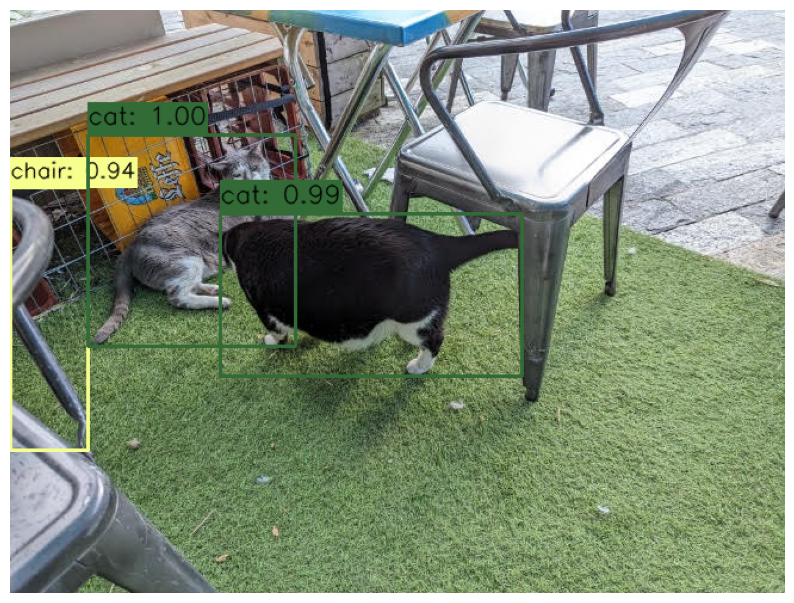

In [12]:
predict_and_plot_boxes("inference_data/own_images/cats.jpg")

## Repeat for more images

Now let's see if this was a one off, or we can get it to accurately identify objects in some more complex images.

We have a range of images here:
* Traffic in front of Big Ben;
* People paddling boats a lake;
* A waterside scene in Copenhagen;
* A crowded market selling leather goods;
* A table at a wine bar.

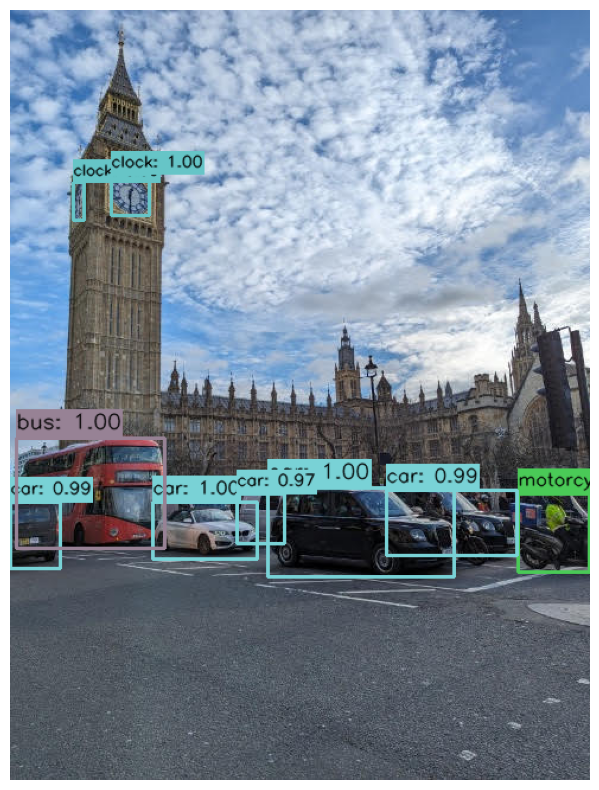

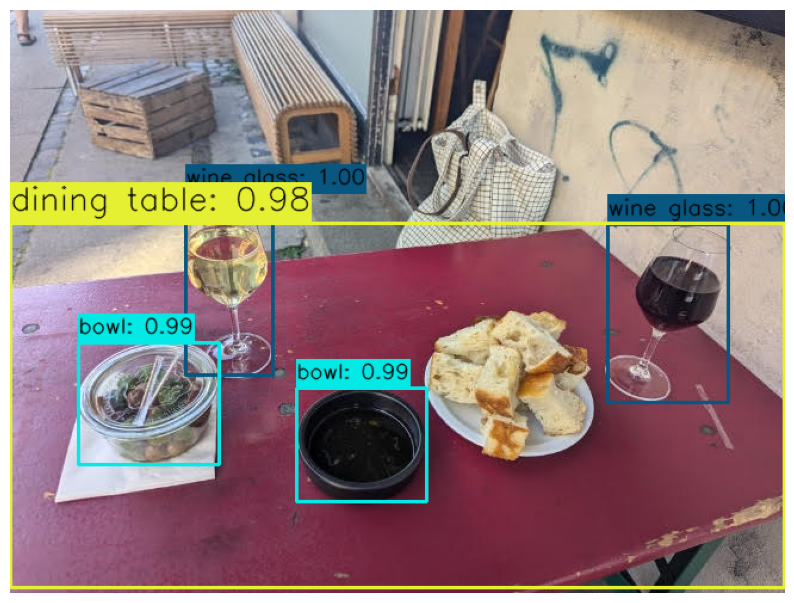

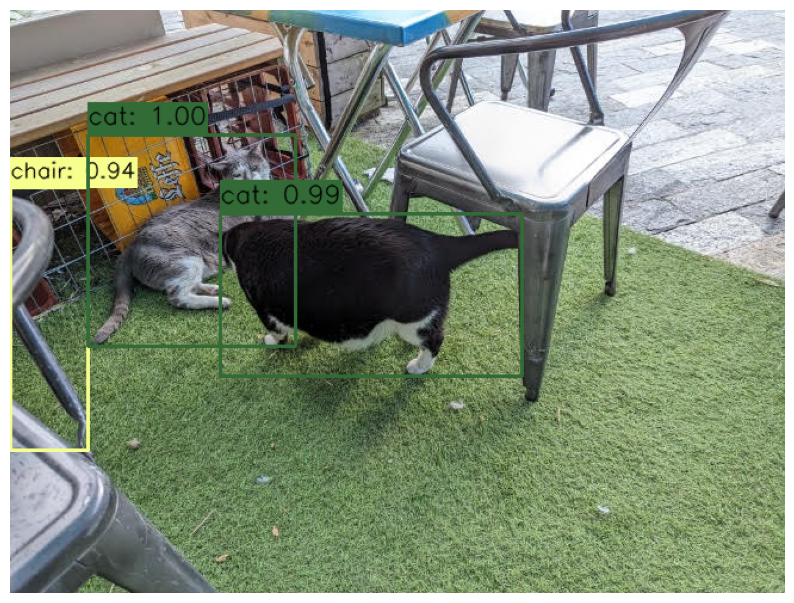

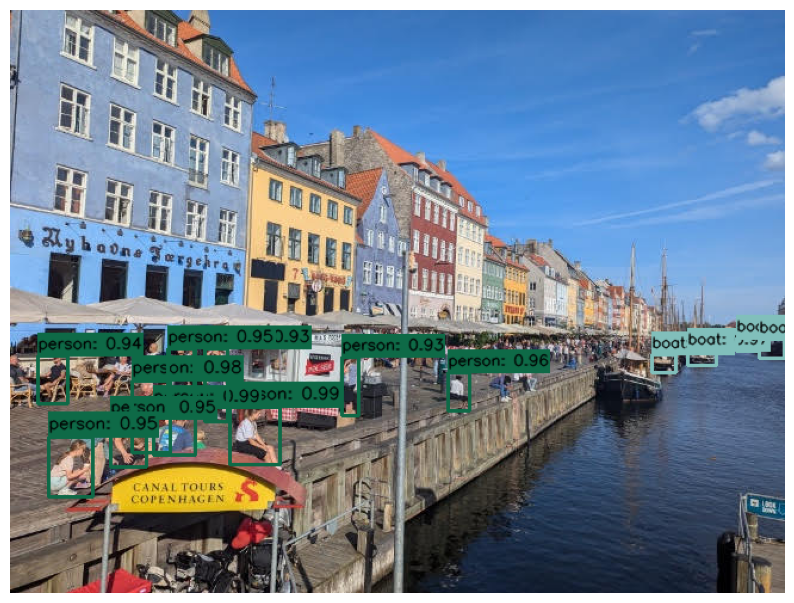

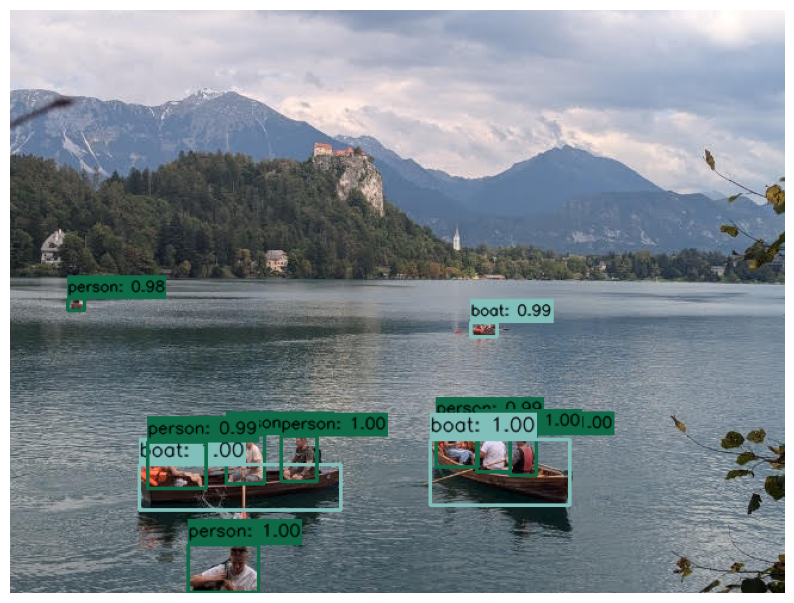

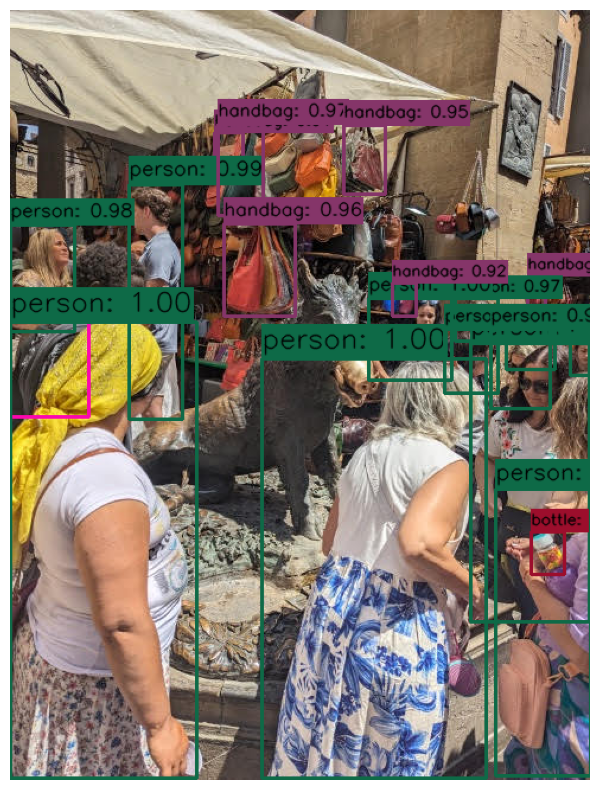

In [13]:
from glob import glob 

total_images = glob("inference_data/own_images/*.jpg")

for image in total_images:
    predict_and_plot_boxes(image)

## Lowering the probability threshold

Let's play around and see what else we can identify if we lowered the probability threshold. We'll try the image of the wine bar.

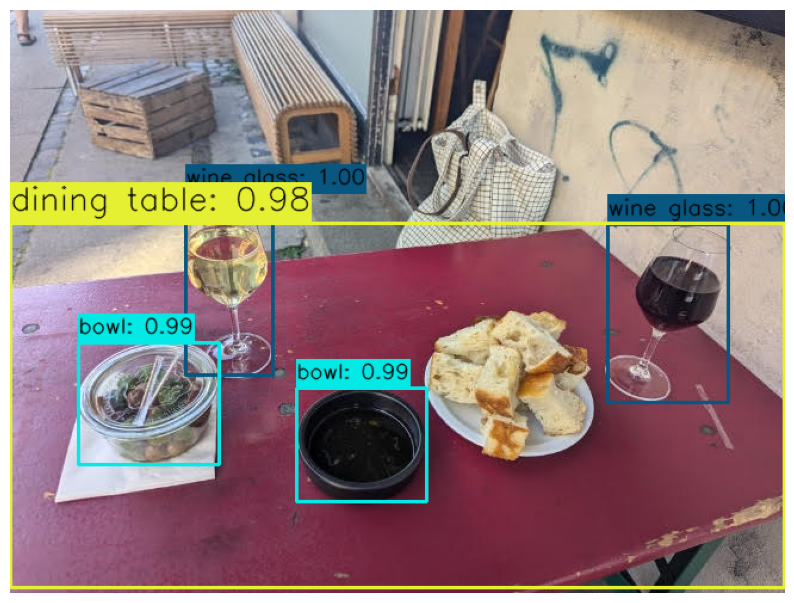

In [14]:
predict_and_plot_boxes("inference_data/own_images/wine_bar.jpg", threshold = 0.9)

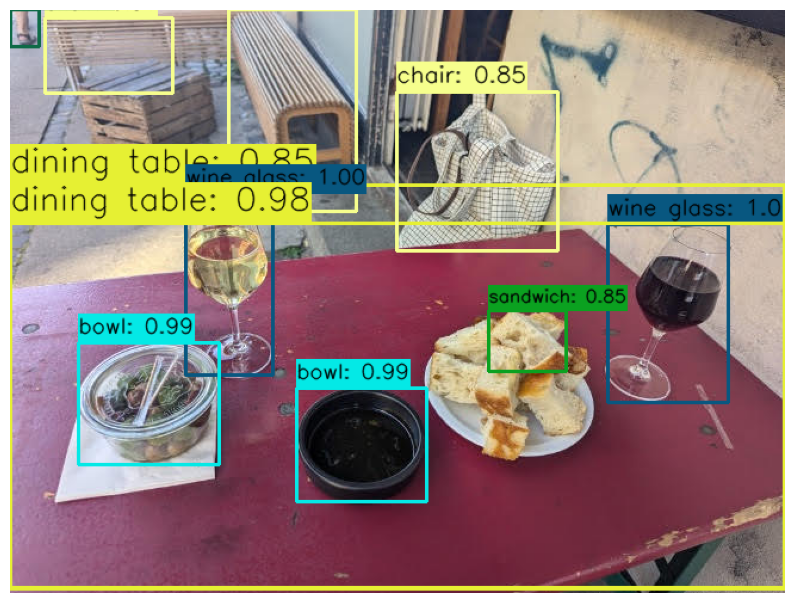

In [15]:
predict_and_plot_boxes("inference_data/own_images/wine_bar.jpg", threshold = 0.7)

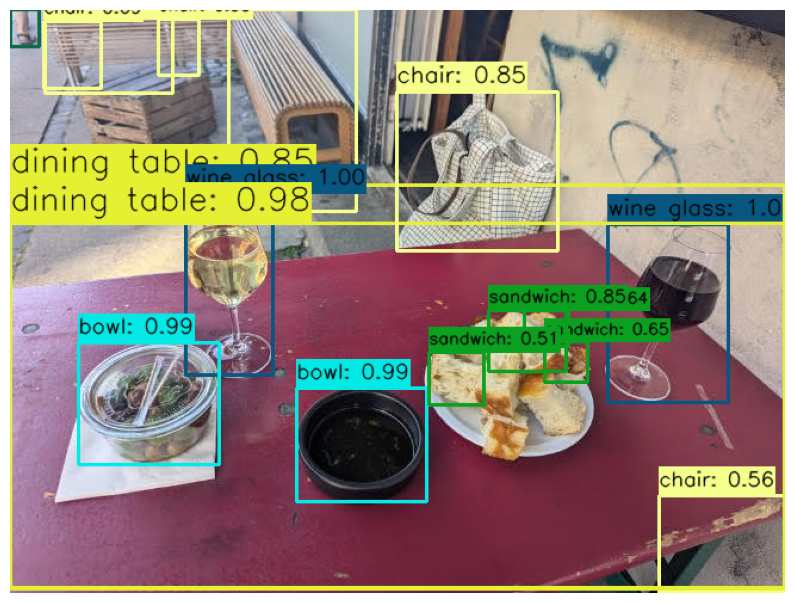

In [16]:
predict_and_plot_boxes("inference_data/own_images/wine_bar.jpg", threshold = 0.5)